# plot Scenic

- load Scenic results
- create anndata with Regulon scores
- plot scores
- plot top regulons per cell type
- plot target genes per regulon

In [1]:
import os, yaml, re
import json
import base64
import zlib
import math

import warnings
from numba import NumbaDeprecationWarning
warnings.filterwarnings("ignore", category=NumbaDeprecationWarning) 

from pathlib import Path
import numpy as np
import scipy as sc
import pandas as pd

import loompy as lp
import scanpy as sc

import matplotlib.pyplot as plt

import ctxcore
from pyscenic.rss import regulon_specificity_scores
from pyscenic.aucell import aucell
from pyscenic.plotting import plot_rss
from adjustText import adjust_text

In [2]:
# Set maximum number of jobs for Scanpy.
sc.settings.njobs = 2

In [81]:
#import matplolib
plt.rcParams['pdf.fonttype'] = 42

*load different loom files here:*

## 1) Load data

### A) original anndata object

In [3]:
anndata = "/nfs/team205/vk8/processed_data/muscle/data_v3/cellxgene_v2/raw/SKM_human_raw_cells2nuclei_2023-12-13.h5ad"

annotation_col = "annotation_level2"

In [4]:
ad = sc.read_h5ad(anndata)

### B) Scenic results

In [20]:
result_dir = Path("/lustre/scratch126/cellgen/team205/jp30/CellRegulonDB/muscle/8Dec23/outputs/results/AUCell/")

loom_files = list(result_dir.glob("**/*.loom"))

select a lineage

loom_files

In [5]:
# choose lineage, e.g. ... myofiber
f_final_loom = '/lustre/scratch126/cellgen/team205/jp30/CellRegulonDB/muscle/13Dec23/outputs/results/AUCell/13Dec23_Myofiber_lineage_splitcomb_comb2/13Dec23_Myofiber_lineage_splitcomb_comb2_pyscenic_output.loom'

read regulons for selected lineage from loom

In [6]:
# scenic output
lf = lp.connect( f_final_loom, mode='r', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)

In [7]:
# create a dictionary of regulons
regulons = {}
for i,r in pd.DataFrame(lf.ra.Regulons,index=lf.ra.Gene).T.iterrows():
    regulons[i] =  list(r[r==1].index.values)

In [8]:
lf.close()

### C) recalculate AUCell scores

In [13]:
### to compute new aucell scores, e.g. for other counts or other regulons

# def get_sig(regulon_dict):
#     return [ctxcore.genesig.GeneSignature(name=k, gene2weight=v) for k, v in regulon_dict.items()]

# auc_mtx = aucell(ad.to_df(), get_sig(regulons))

### D) save regulons as dataframe for easier filtering

In [9]:
regulon_df_wide = pd.DataFrame({reg: {tg: True for tg in targets} for reg, targets in regulons.items()}).replace(np.nan, False).T

In [10]:
regulon_df = regulon_df_wide.stack()
regulon_df = regulon_df[regulon_df]
regulon_df = regulon_df.reset_index().rename(columns={"level_0":"Regulon", "level_1":"Target"}).drop(columns=[0])
regulon_df = pd.concat([regulon_df, regulon_df.Regulon.str.extract("(?P<TF>.+)\((?P<Sign>[+-])\)", expand=True)], axis=1)

In [11]:
# e.g. search for TFs activating CCL2
regulon_df.query("Target == 'CCL2' and Sign == '+'")

,Regulon,Target,TF,Sign
38065,ETV6(+),CCL2,ETV6,+
52457,IRF1(+),CCL2,IRF1,+
84091,PRDM1(+),CCL2,PRDM1,+
84902,RELA(+),CCL2,RELA,+
91827,STAT3(+),CCL2,STAT3,+


### E) plot a network using networkx

More options for visualisation in Cytoscape. (The dataframe can be saved as a CSV file and imported into Cytoscape.)

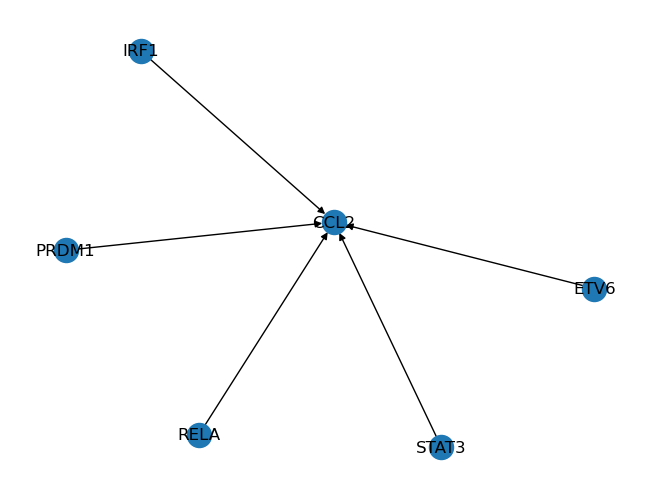

In [14]:
import networkx as nx

G = nx.from_edgelist([(r.TF, r.Target) for _,r in regulon_df.query("Target == 'CCL2' and Sign == '+'").iterrows()], create_using=nx.DiGraph)
nx.draw_kamada_kawai(G, with_labels=True)

## 2) Create anndata with regulon scores

### A) create the object

scores in `auc_mtx`

In [15]:
ad_scenic = sc.AnnData(auc_mtx)

In [16]:
ad_scenic = ad_scenic[ad_scenic.obs_names.isin(ad.obs_names)]

add cell annotation

In [17]:
ad_scenic.obs = ad_scenic.obs.merge(ad.obs, how='left', left_index=True, right_index=True)

add original umap (based on GEX)

In [18]:
ad_scenic.obsm["X_umap_genes"] = ad[ad_scenic.obs_names].obsm["X_umap"]

In [19]:
ad_scenic.obs[annotation_col] = ad_scenic.obs[annotation_col].astype(str).astype('category')

original umap

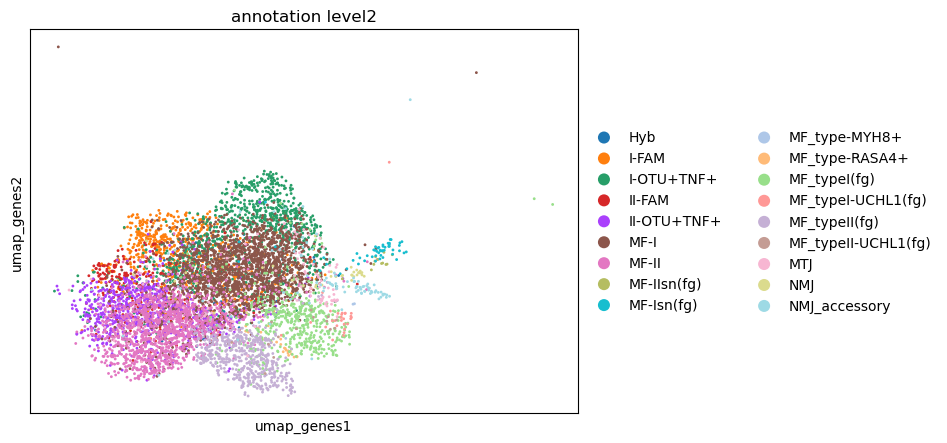

In [21]:
sc.pl.scatter(ad_scenic, color = annotation_col, basis = "umap_genes")

### B) plot TF scores on a UMAP

create embedding for cells based on regulon scores

In [26]:
sc.pp.highly_variable_genes(ad_scenic)

In [27]:
sc.pp.scale(ad_scenic)

In [28]:
sc.tl.pca(ad_scenic)

In [29]:
sc.pp.neighbors(ad_scenic)

In [30]:
sc.tl.paga(ad_scenic, groups=annotation_col)

In [32]:
sc.tl.umap(ad_scenic, init_pos="paga")

/home/ubuntu/mambaforge/envs/scenicplus/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ubuntu/mambaforge/envs/scenicplus/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


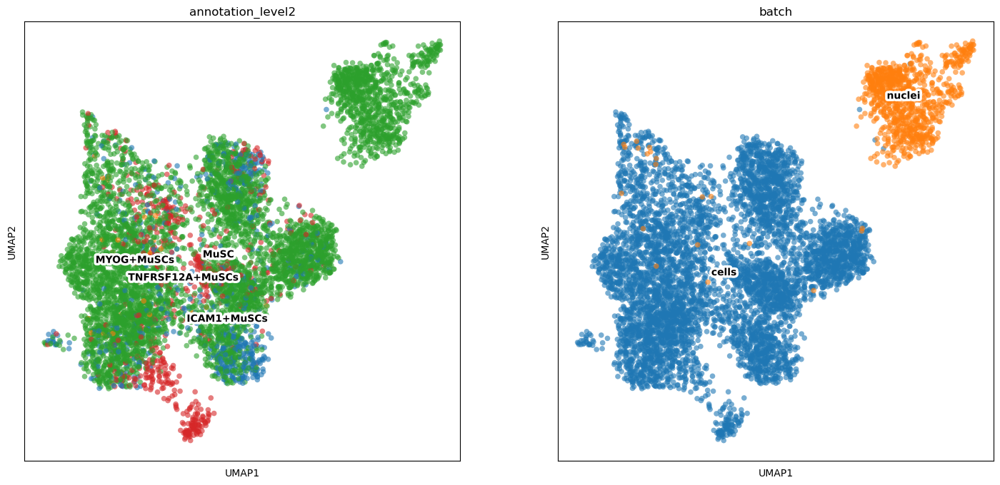

In [33]:
with plt.rc_context({"figure.figsize": (8, 8), "figure.dpi": 100, "figure.frameon": True, "figure.facecolor": "white"}):
    sc.pl.umap(
        ad_scenic, 
        color = [
            x
            for x in [annotation_col, "batch"]
            if x in ad_scenic.obs
        ], 
        legend_loc = "on data",
        ncols = 2,
        frameon = True, 
        legend_fontoutline = 5,
        size=120, 
        alpha = 0.6,
#         save="scenic_umap.png"
    )

## 3) Regulon specificity scores (RSS)

While the AUCell scores (`auc_mtx`) reflect TF activities, RSS scores can be used to find TFs that are specific for a cell type, somewhat analogous to marker genes.

keep only positive regulators for RSS calculation

In [23]:
ad_scenic = ad_scenic[:,["(+)" in x for x in ad_scenic.var_names]]

In [24]:
auc_mtx = auc_mtx.loc[:,["(+)" in x for x in auc_mtx.columns]]

find regulons that are specific for each cell type

In [25]:
cats = sorted(ad_scenic.obs[annotation_col].unique().tolist())

In [26]:
rss_cellType = regulon_specificity_scores(auc_mtx, ad_scenic.obs[annotation_col])

KeyboardInterrupt: 

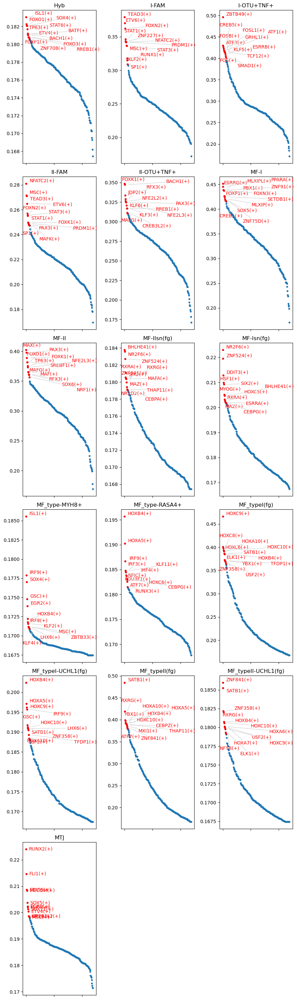

In [30]:
N = len(cats)
ncols = 3   ## number of columns
nrows = math.ceil(N / 3)


fig = plt.figure(figsize=(3*ncols, 5*nrows))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(nrows, ncols, num)
    plot_rss(rss_cellType, c, top_n=12, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(10)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large',
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
# plt.savefig("../../SCENIC/tip_stalk_secretory_23Sep21_3/rss_top5.png", dpi=600, bbox_inches = "tight")
plt.show()

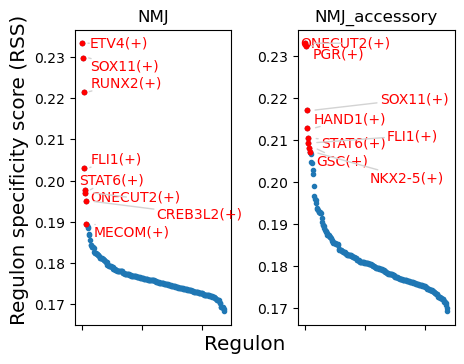

In [95]:
N = 2
ncols = 2
nrows = 1
## number of columns
#nrows = math.ceil(N / 3)

cats = ['NMJ', 'NMJ_accessory']
fig = plt.figure(figsize=(4.5, 3.5))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(nrows, ncols, num)
    plot_rss(rss_cellType, c, top_n=8, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(10)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )

fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large',
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
plt.savefig("figures/rss_top5_NMJ_vs_NMJ_accessory.pdf", dpi=300, bbox_inches = "tight")
plt.show()

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_utils.py:288: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


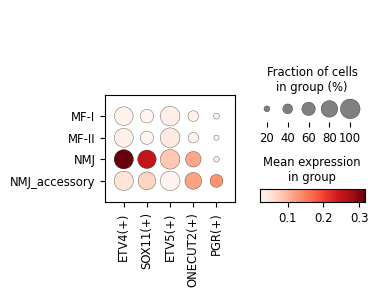

In [96]:
sc.pl.dotplot(ad_scenic[ad_scenic.obs["annotation_level1"].isin(['MF-I', 'MF-II', 'NMJ', 'NMJ_accessory'])], 
              var_names = ['ETV4(+)','SOX11(+)', 'ETV5(+)', 'ONECUT2(+)', 'PGR(+)'], 
                  groupby=["annotation_level1"], 
                  swap_axes=False, save = "NMJ_regulons.pdf")

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_utils.py:288: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


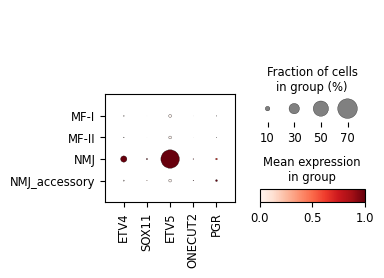

In [99]:
sc.pl.dotplot(ad[ad.obs["annotation_level1"].isin(['MF-I', 'MF-II', 'NMJ', 'NMJ_accessory'])], 
              var_names = ['ETV4','SOX11', 'ETV5', 'ONECUT2', 'PGR'], 
                  groupby=["annotation_level1"], standard_scale = "var",
                  swap_axes=False, save = "NMJ_tf_expression.pdf")

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


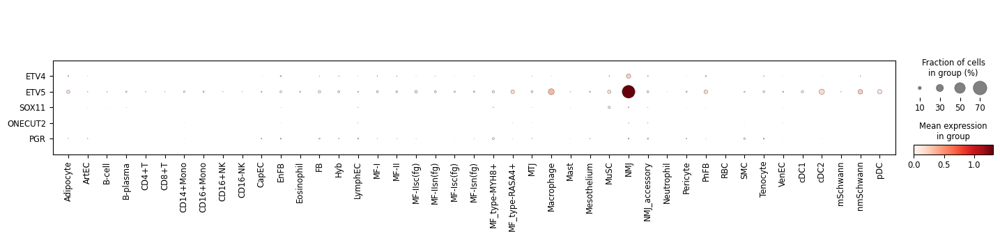

In [88]:
sc.pl.dotplot(ad, var_names = ['ETV4', 'ETV5', 'SOX11', 'ONECUT2', 'PGR'], 
                  groupby=["annotation_level1"], 
                  swap_axes=True)

## 4) Extra plots

### A) dotplot of target gene expression per regulon

In [69]:
rss_cellType.T['NMJ'].sort_values(ascending=False).index.tolist()

['ETV4(+)',
 'SOX11(+)',
 'RUNX2(+)',
 'FLI1(+)',
 'STAT6(+)',
 'ONECUT2(+)',
 'CREB3L2(+)',
 'MECOM(+)',
 'RUNX1(+)',
 'MSC(+)',
 'CREM(+)',
 'EGR3(+)',
 'ETV5(+)',
 'SOX5(+)',
 'EGR2(+)',
 'KLF4(+)',
 'IKZF1(+)',
 'LHX6(+)',
 'FOXK1(+)',
 'GSC(+)',
 'HIVEP3(+)',
 'RUNX3(+)',
 'NR2C1(+)',
 'IRF4(+)',
 'KLF12(+)',
 'RFX3(+)',
 'GRHL1(+)',
 'ZFHX2(+)',
 'NFKB2(+)',
 'SOX4(+)',
 'IRF9(+)',
 'FOSB(+)',
 'MEIS3(+)',
 'BATF(+)',
 'ZNF23(+)',
 'ZFY(+)',
 'ZNF708(+)',
 'JDP2(+)',
 'IRF6(+)',
 'BACH1(+)',
 'FOSL1(+)',
 'IRF8(+)',
 'ZEB1(+)',
 'RREB1(+)',
 'HEY2(+)',
 'IRF1(+)',
 'OLIG1(+)',
 'PRDM1(+)',
 'NFATC2(+)',
 'SP3(+)',
 'ETS2(+)',
 'SMAD1(+)',
 'ZNF444(+)',
 'KLF2(+)',
 'KLF5(+)',
 'TP63(+)',
 'KLF3(+)',
 'ETV6(+)',
 'FOXP1(+)',
 'TP53(+)',
 'IRF2(+)',
 'KLF16(+)',
 'HIF1A(+)',
 'EGR1(+)',
 'ATF6(+)',
 'NFIC(+)',
 'CREB5(+)',
 'NKX2-5(+)',
 'ELF1(+)',
 'ATF1(+)',
 'MEF2C(+)',
 'ELK4(+)',
 'ATF3(+)',
 'ZNF75D(+)',
 'BHLHE40(+)',
 'JUNB(+)',
 'ZBTB33(+)',
 'PAX3(+)',
 'CUX1(+)',
 'XBP1(

In [70]:
rss_cellType.T['NMJ_accessory'].sort_values(ascending=False).index.tolist()

['ONECUT2(+)',
 'PGR(+)',
 'SOX11(+)',
 'HAND1(+)',
 'STAT6(+)',
 'FLI1(+)',
 'GSC(+)',
 'NKX2-5(+)',
 'RUNX2(+)',
 'SOX5(+)',
 'GRHL1(+)',
 'IKZF1(+)',
 'BATF(+)',
 'ETV4(+)',
 'MECOM(+)',
 'OLIG1(+)',
 'IRF4(+)',
 'IRF9(+)',
 'RUNX3(+)',
 'CREB3L2(+)',
 'HIF1A(+)',
 'SMAD1(+)',
 'EGR3(+)',
 'MEIS3(+)',
 'EGR2(+)',
 'GCM1(+)',
 'KLF12(+)',
 'IRF6(+)',
 'ZBTB49(+)',
 'IRF8(+)',
 'KLF4(+)',
 'LHX6(+)',
 'PRDM1(+)',
 'ISL1(+)',
 'MEF2C(+)',
 'FOSL1(+)',
 'IRF1(+)',
 'CREB5(+)',
 'CREM(+)',
 'FOSB(+)',
 'NFKB2(+)',
 'FOXD2(+)',
 'FOXP1(+)',
 'SOX4(+)',
 'PAX3(+)',
 'ELK4(+)',
 'STAT4(+)',
 'ZNF189(+)',
 'FOXN3(+)',
 'KLF5(+)',
 'ATF3(+)',
 'UNCX(+)',
 'ATF1(+)',
 'ESRRG(+)',
 'PPARA(+)',
 'ZEB1(+)',
 'FOXP2(+)',
 'NFE2L3(+)',
 'ESRRB(+)',
 'KLF2(+)',
 'SETDB1(+)',
 'RFX3(+)',
 'FOXK1(+)',
 'TP63(+)',
 'CREB1(+)',
 'CUX1(+)',
 'PBX1(+)',
 'ELF1(+)',
 'NRF1(+)',
 'FOXJ2(+)',
 'MSC(+)',
 'ZNF708(+)',
 'SP3(+)',
 'ETV5(+)',
 'BPTF(+)',
 'FOXN2(+)',
 'ZNF444(+)',
 'HIVEP3(+)',
 'ZNF143(+)',
 '

In [56]:
top_n = 12   ### number of regulons to plot per cell type

topreg = []
for i, c in enumerate(cats):
    
    topreg.extend(
        rss_cellType.T[c].sort_values(ascending=False)[:top_n].index.tolist()
    )

In [57]:
topreg = ['ETV5(+)'] + topreg

topreg = list(set(topreg))

In [58]:
regulons = {k:[str(i) for i in v] for k,v in regulons.items()}

In [59]:
topreg

['ETV5(+)',
 'ETV4(+)',
 'SOX11(+)',
 'RUNX2(+)',
 'FLI1(+)',
 'STAT6(+)',
 'ONECUT2(+)',
 'CREB3L2(+)',
 'MECOM(+)',
 'RUNX1(+)',
 'MSC(+)',
 'CREM(+)',
 'EGR3(+)',
 'ONECUT2(+)',
 'PGR(+)',
 'SOX11(+)',
 'HAND1(+)',
 'STAT6(+)',
 'FLI1(+)',
 'GSC(+)',
 'NKX2-5(+)',
 'RUNX2(+)',
 'SOX5(+)',
 'GRHL1(+)',
 'IKZF1(+)']

In [62]:
reg.rstrip("(+)")

'IKZF1'

In [67]:
ad.obs['annotation_level1'].cat.categories

Index(['Adipocyte', 'ArtEC', 'B-cell', 'B-plasma', 'CD4+T', 'CD8+T',
       'CD14+Mono', 'CD16+Mono', 'CD16+NK', 'CD16-NK', 'CapEC', 'EnFB',
       'Eosinophil', 'FB', 'Hyb', 'LymphEC', 'MF-I', 'MF-II', 'MF-IIsc(fg)',
       'MF-IIsn(fg)', 'MF-Isc(fg)', 'MF-Isn(fg)', 'MF_type-MYH8+',
       'MF_type-RASA4+', 'MTJ', 'Macrophage', 'Mast', 'Mesothelium', 'MuSC',
       'NMJ', 'NMJ_accessory', 'Neutrophil', 'Pericyte', 'PnFB', 'RBC', 'SMC',
       'Tenocyte', 'VenEC', 'cDC1', 'cDC2', 'mSchwann', 'nmSchwann', 'pDC'],
      dtype='object')

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_utils.py:288: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


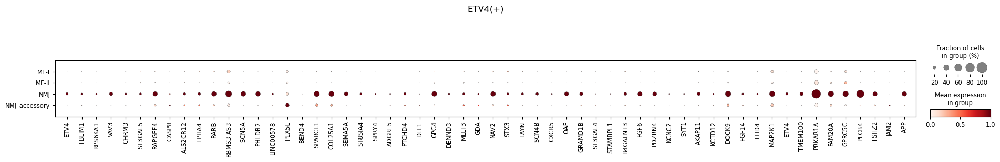

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_utils.py:288: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


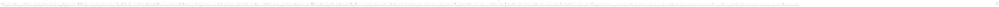

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_utils.py:288: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


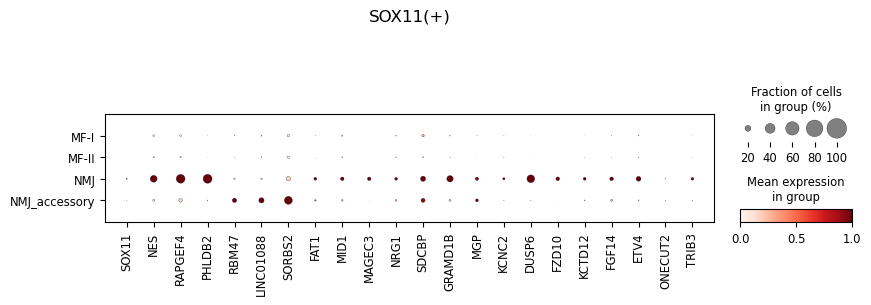

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_utils.py:288: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


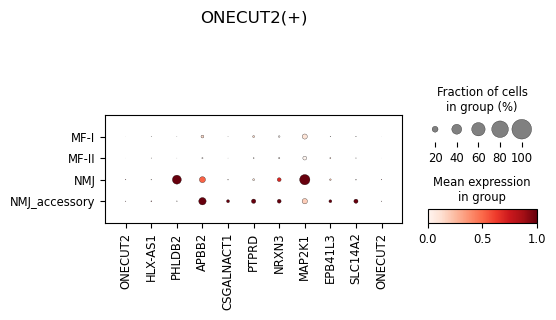

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_utils.py:288: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


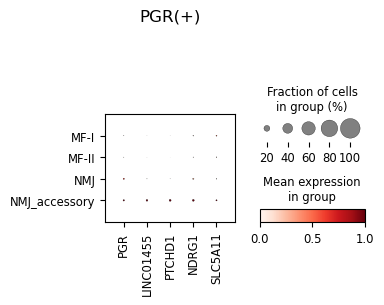

In [94]:
for reg in ['ETV4(+)', 'ETV5(+)', 'SOX11(+)', 'ONECUT2(+)', 'PGR(+)']:
    plot_regulon = reg

    sc.pl.dotplot(
        ad[((ad.obs['lineage'] == 'Myofiber') & \
            (ad.obs['annotation_level1'].isin(['MF-I', 'MF-II','NMJ', 'NMJ_accessory']))),:], 
        var_names = [plot_regulon.rstrip("(+)")]+ regulons[plot_regulon], 
        groupby = 'annotation_level1',
        title = reg, dot_max = 1, 
        standard_scale = "var", save = f"{reg}_target_expression.pdf"
    )

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


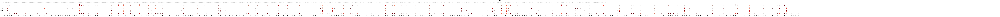

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


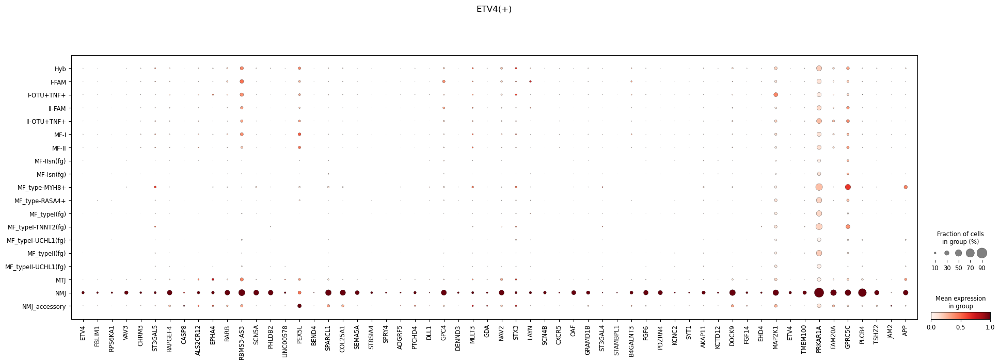

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


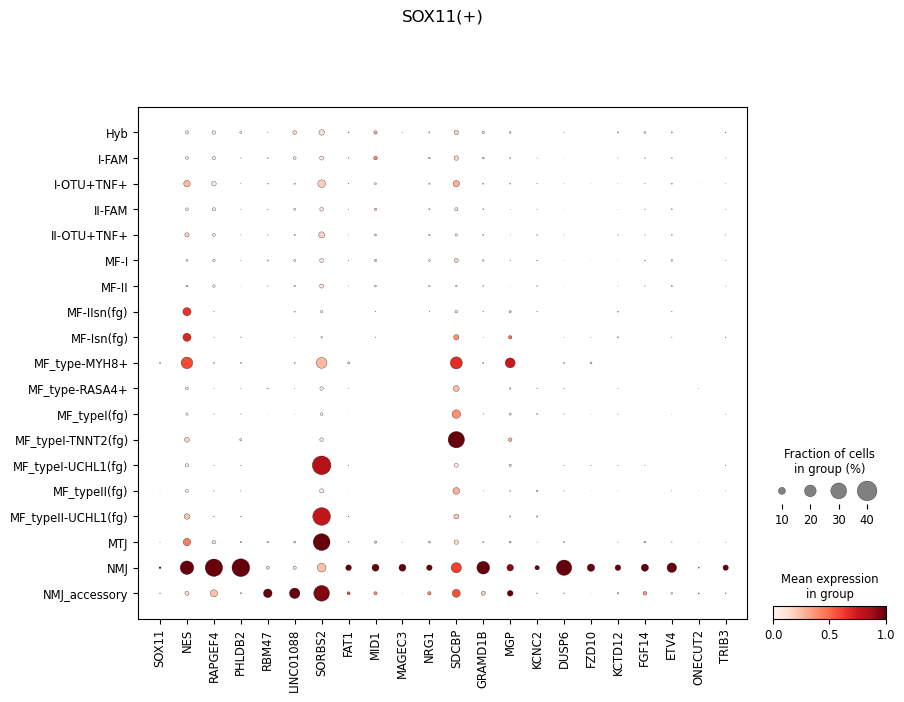

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


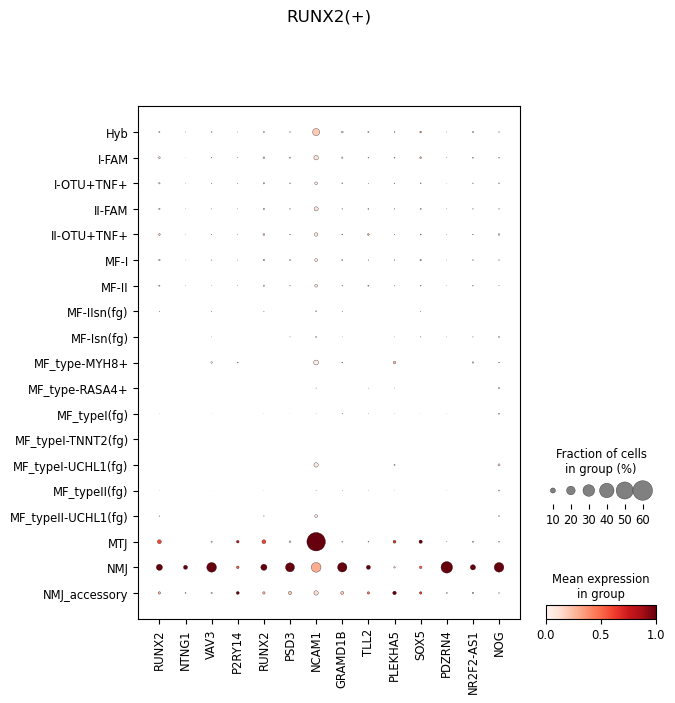

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


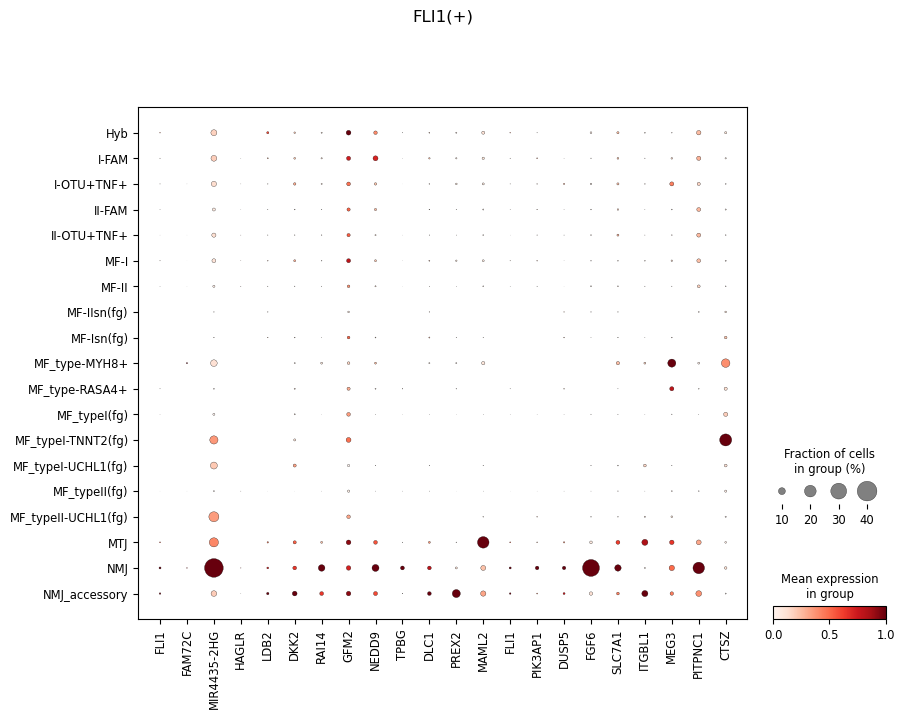

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


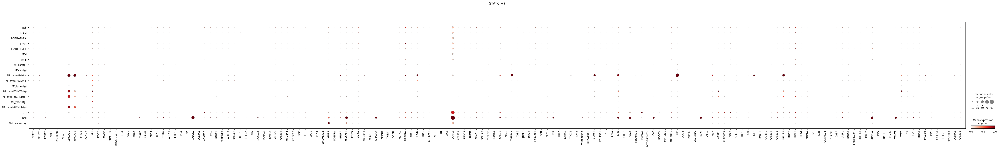

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


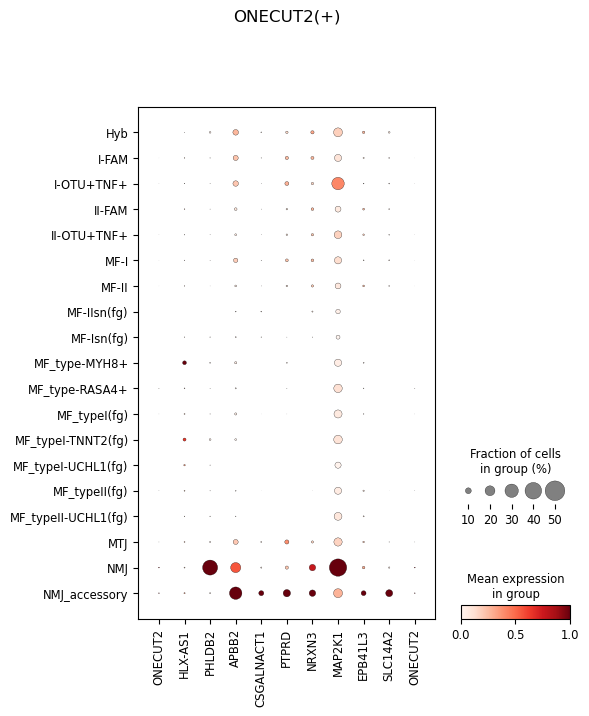

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


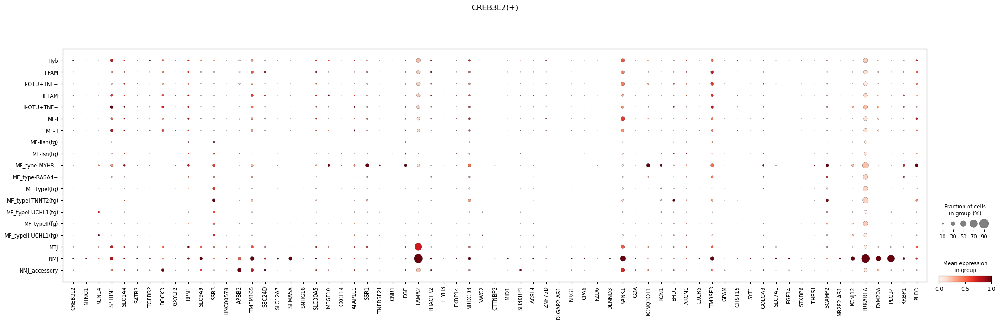

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


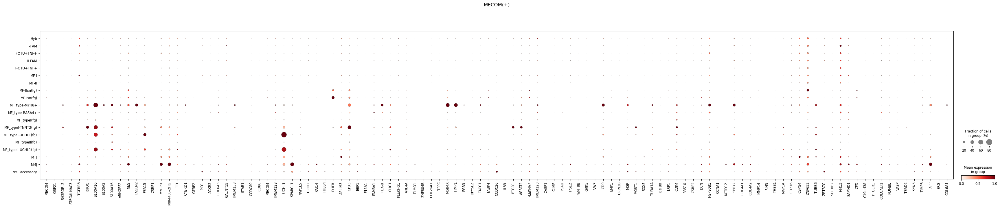

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


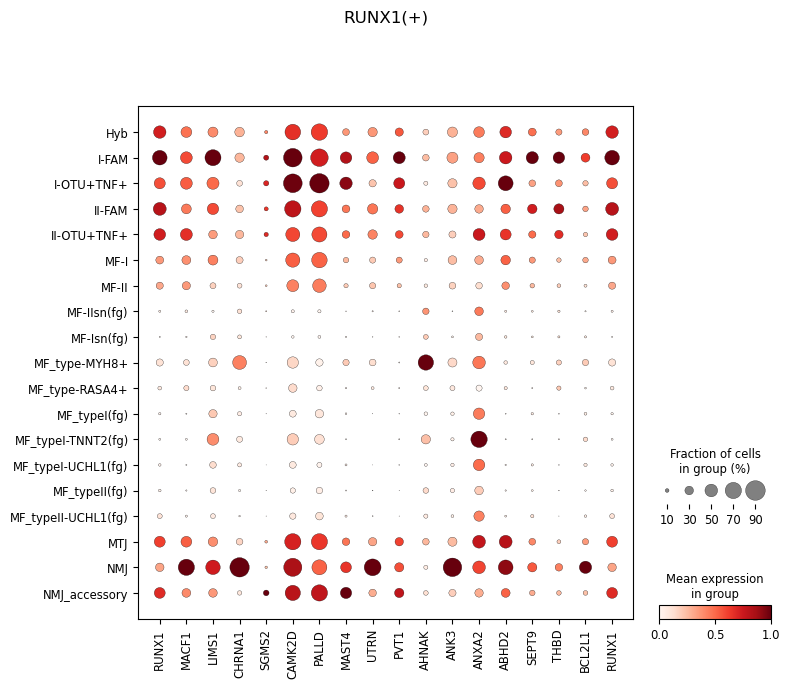

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


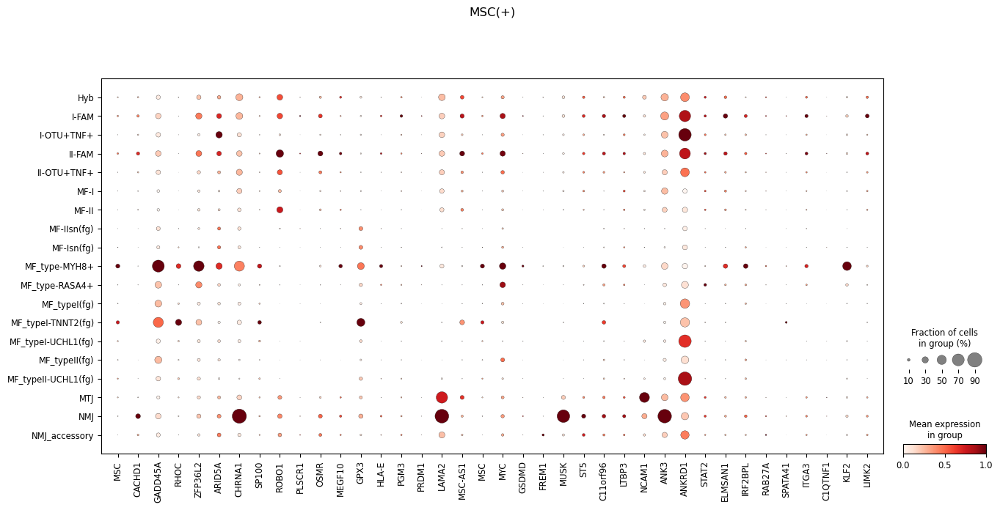

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


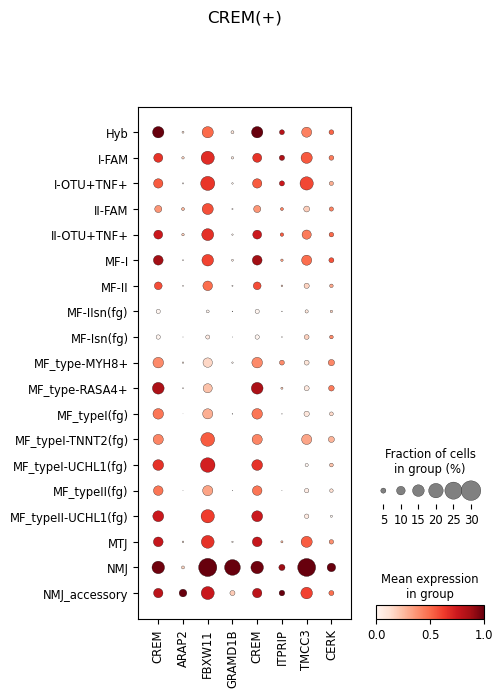

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


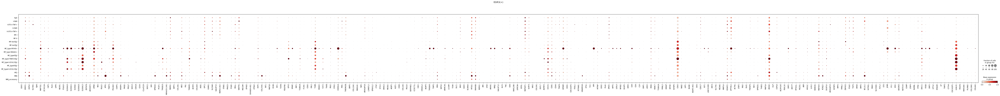

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


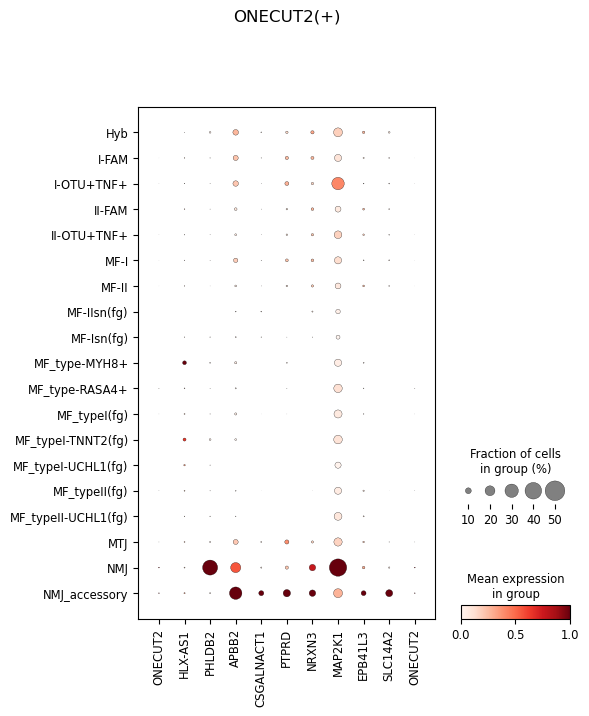

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


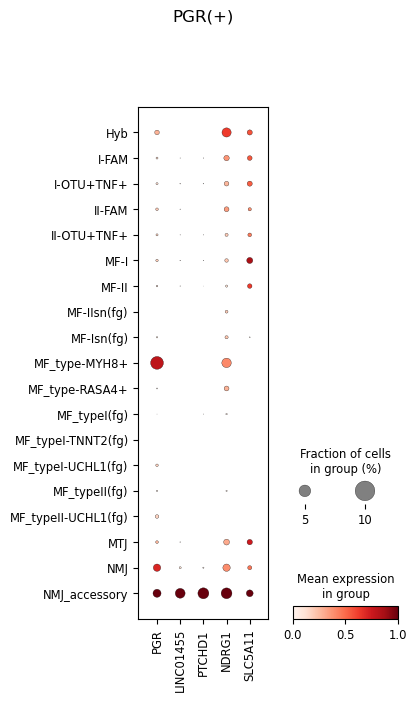

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


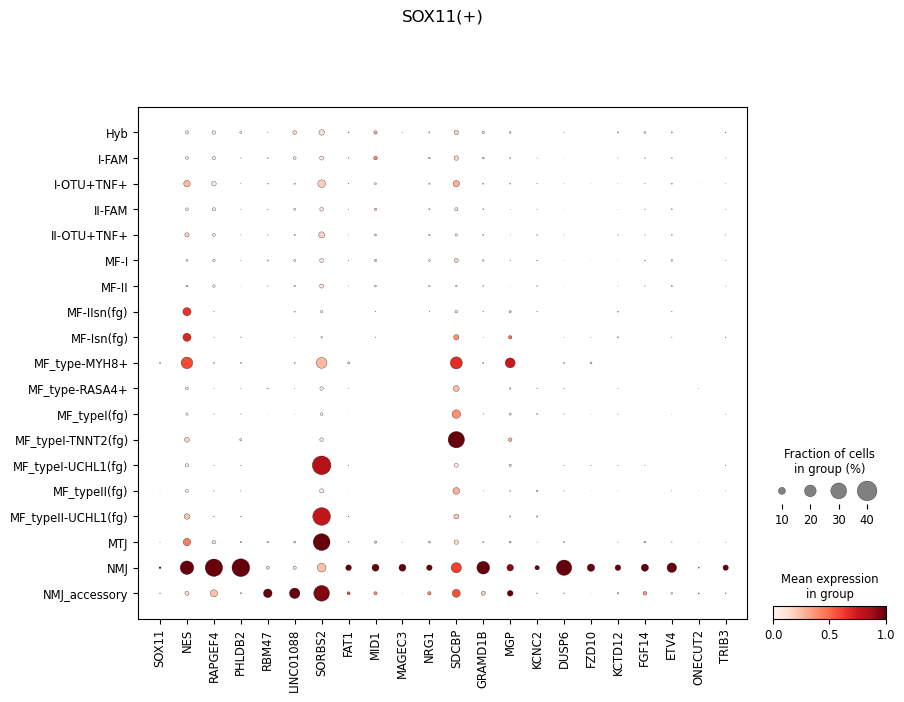

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


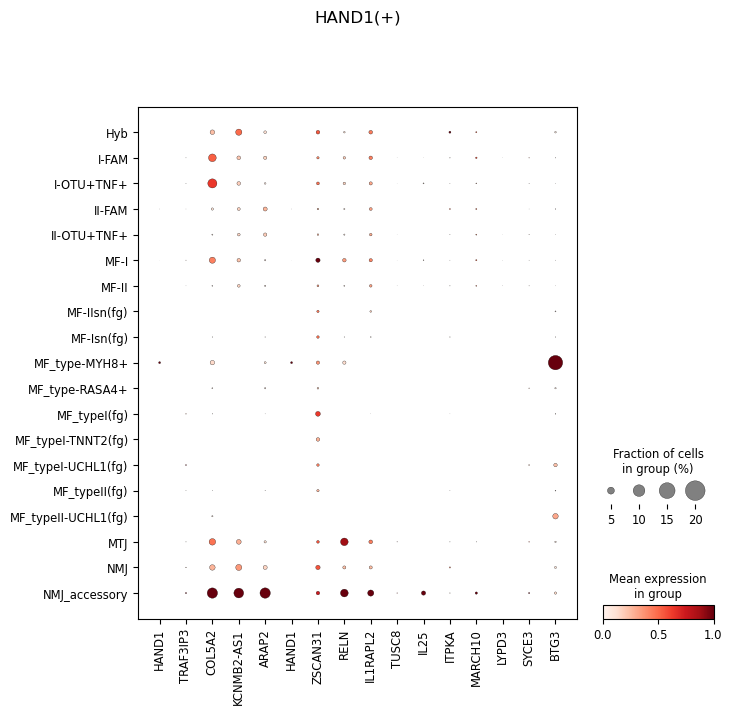

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


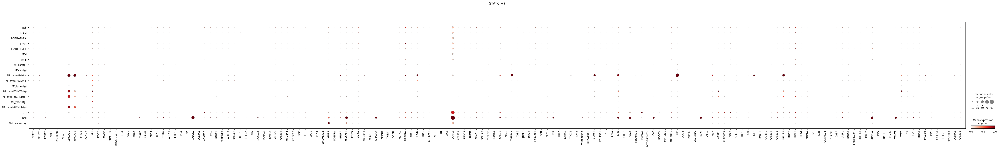

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


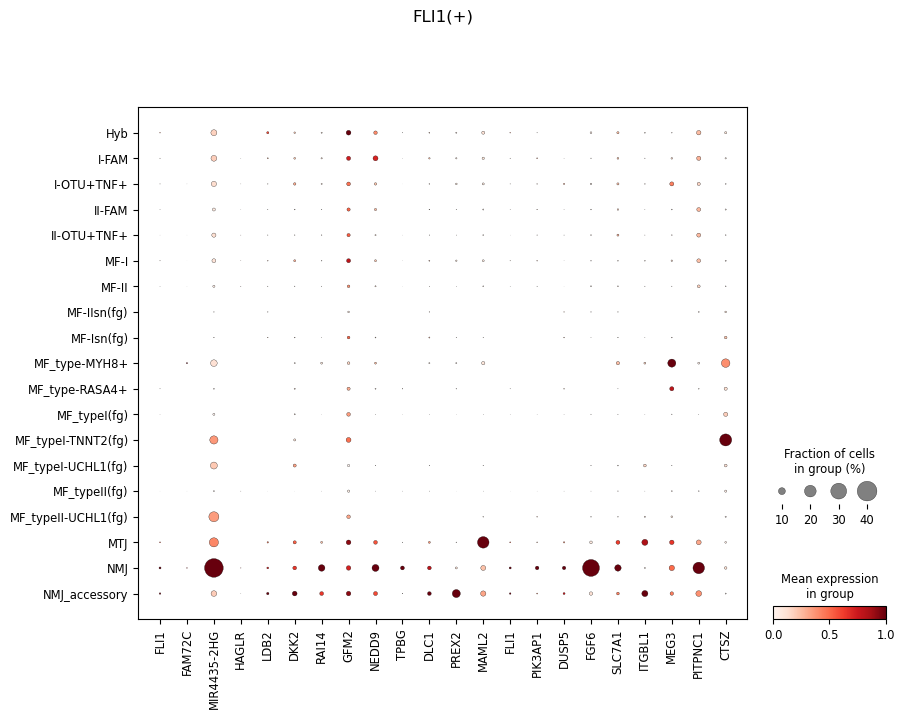

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


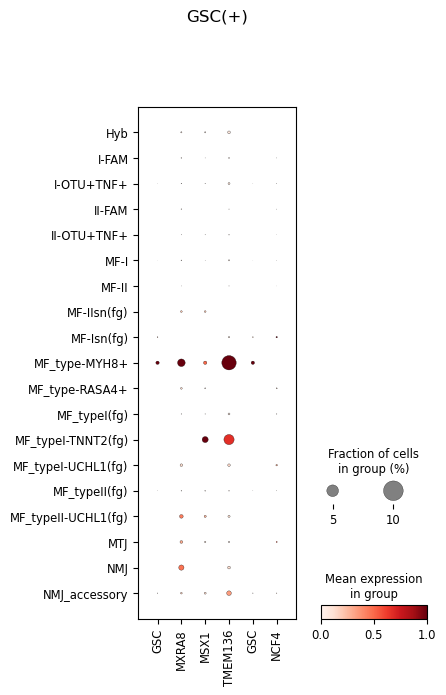

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


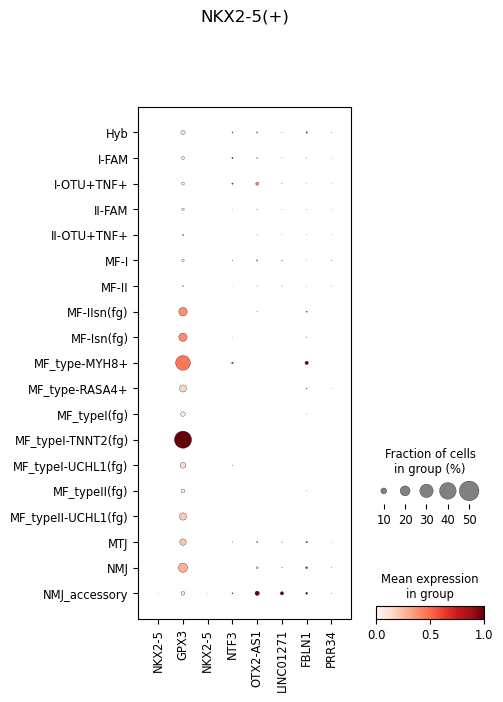

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


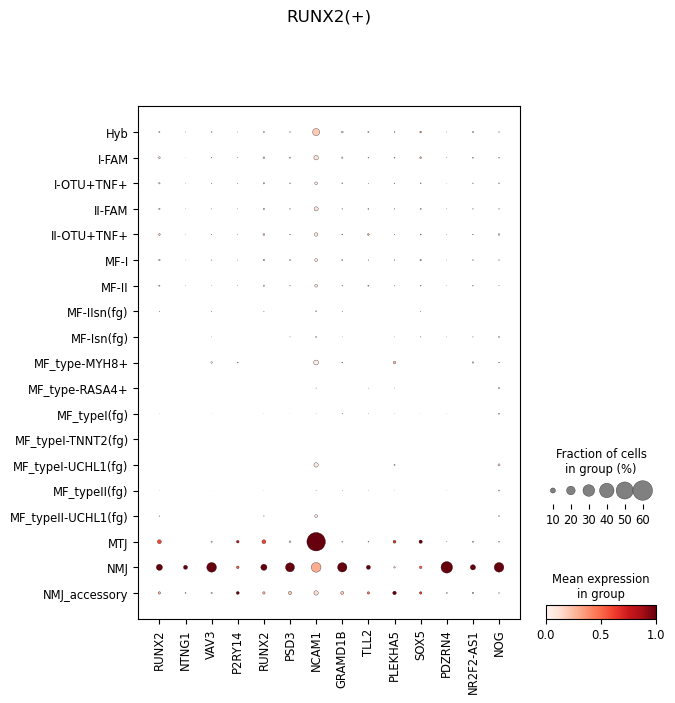

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


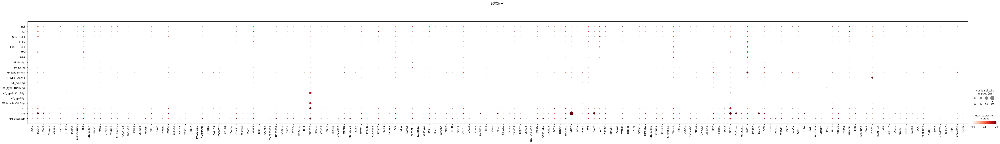

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


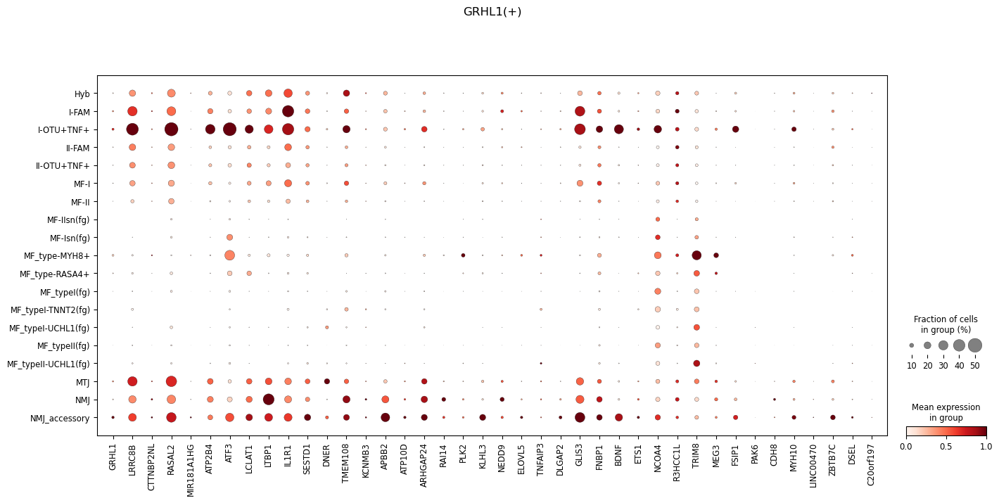

/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)
/lustre/scratch126/cellgen/team205/jp30/mambaforge/envs/scenic/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


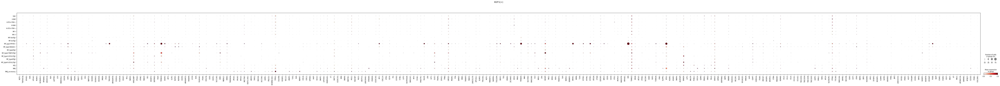

In [63]:
for reg in topreg:
    plot_regulon = reg

    sc.pl.dotplot(
        ad[ad.obs['lineage'] == 'Myofiber',:], 
        var_names = [plot_regulon.rstrip("(+)")]+ regulons[plot_regulon], 
        groupby = annotation_col,
        title = reg,
        standard_scale = "var",
    )

### B) Overlap of target genes for TF-pairs

overlap measured as Jaccard coefficients

In [43]:
import seaborn as sns

In [44]:
reg_table = pd.DataFrame({k:{x: 1 for x in v} for k,v in regulons.items() if k in topreg})

In [45]:
reg_table[reg_table.isna()] = 0

In [46]:
def jacc_coef(col1, col2):
    n_intersect = (col1.astype(bool) & col2.astype(bool)).sum()
    n_union = (col1.astype(bool) | col2.astype(bool)).sum()
    return n_intersect / n_union

In [47]:
jacc_df = pd.DataFrame(columns = reg_table.columns, index = reg_table.columns)

for col1 in reg_table:
    for col2 in reg_table:
        jacc_df[col1][col2] = jacc_coef(reg_table[col1], reg_table[col2])

In [48]:
jacc_df = jacc_df.astype(float)

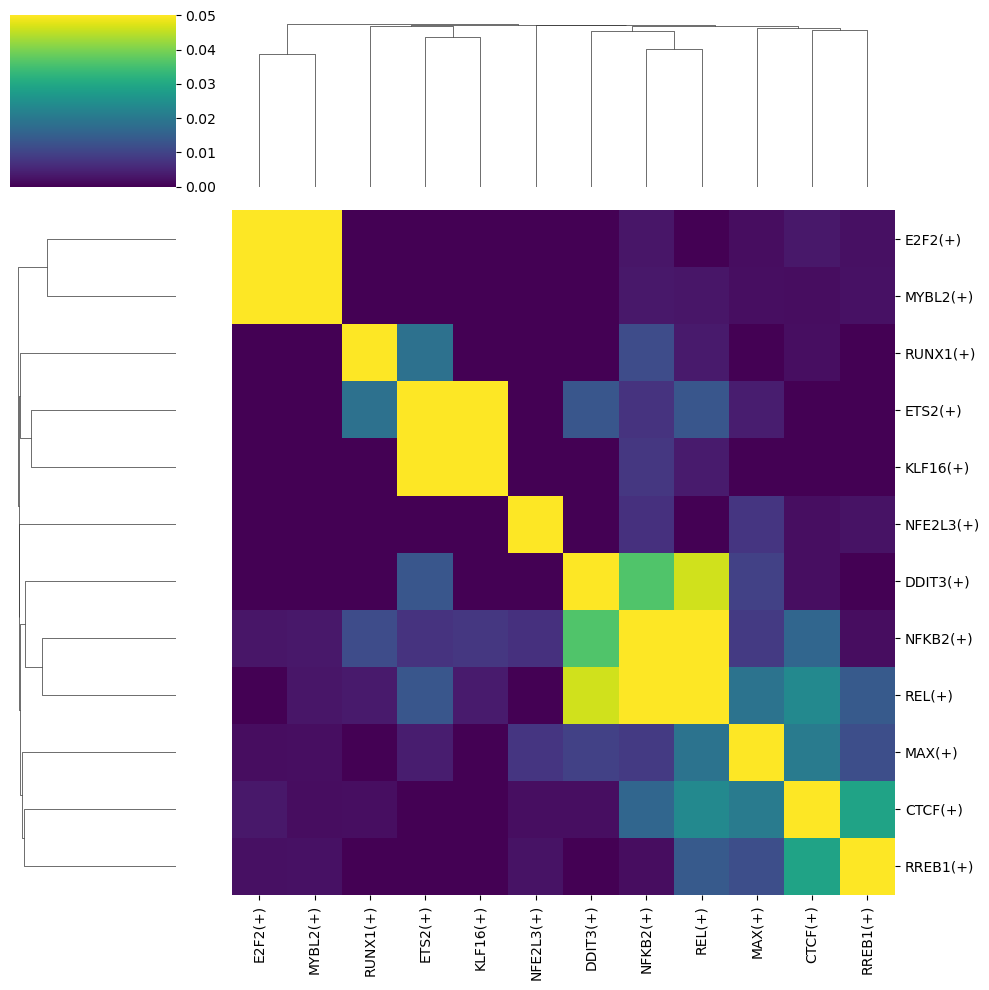

In [49]:
sns.clustermap(jacc_df, cmap="viridis", vmax=0.05)